# **Détection des boiteries d'un cheval à l'aide d'un smartphone**  
**@author : Armand & Albane COIFFE**  
*@email : armandcoiffe@gmail.com , albanecoiffe@gmail.com*     

## Introduction

Le bien-être animal est un enjeu crucial dans le monde de l’équitation, aussi bien pour les cavaliers de loisir que pour les professionnels de la compétition. L'une des principales préoccupations concerne la boiterie des chevaux, qui peut être détectée grâce à des changements dans l'appui et l'accélération lors de leur locomotion. Lorsque le cheval ressent une douleur, il allège son appui sur le membre affecté, entraînant des modifications de ses mouvements qui peuvent être mesurées. Nous nous intéresserons donc aux indices de symétrie (ISG).   

Dans ce contexte, le projet est construit dans l’optique de mettre au point un système accessible à tous les cavaliers pour effectuer un **suivi quantitatif de la biomécanique** du cheval.   
Ce suivi est réalisé par la mesure et l'analyse de **l’accélération verticale** via par exemple l’ application ***PhysicsToolboxAccelerometer*** disponible sur smartphone.   

##### **Problématique retenue :**    
La mesure de l’accélération du cheval lors de sa locomotion à partir d’un smartphone constitue- t-elle une évaluation fiable de sa santé ?

##### Sommaire :    
- Import des libraries   
- 1 - Données au trot en ligne 1   
- 2 - Données au trot en ligne 2     
- 3 - Données au trot en cercle à droite  
- 4 - Données au trot en cercle à gauche
- Récapitulatif

## </a><span style="color:#C23028">**Import des libraries**</span><a class="anchor" id="import-des-libraries"></a>

In [406]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy.signal import butter, filtfilt
from scipy.integrate import cumtrapz
from scipy.signal import find_peaks
import plotly.express as px

## <span style="color:#C23028">**1 - Données au trot en ligne 1**</span>         
Relevé de données du 2024-06-08    
### **Charger les données**

In [407]:
Trot_ligne1 = pd.read_csv('data/Trot_ligne2.csv', sep=';')
Trot_ligne1.reset_index(inplace=True)

In [408]:
Trot_ligne1.columns = ['time', 'gFx', 'gFy', 'gFz', 'alpha']
Trot_ligne1['time'] = Trot_ligne1['time'].map(pd.to_datetime)
Trot_ligne1.set_index('time', inplace=True)
Trot_ligne1.head()

,gFx,gFy,gFz,alpha
time,,,,
2024-06-08 14:30:11.291,0.022,-0.836,-0.573,1.014
2024-06-08 14:30:11.298,-0.018,-0.776,-0.607,0.985
2024-06-08 14:30:11.309,-0.111,-0.804,-0.660,1.046
2024-06-08 14:30:11.322,-0.105,-0.824,-0.608,1.029
2024-06-08 14:30:11.345,-0.014,-0.831,-0.532,0.987


In [409]:
Trot_ligne1.tail()

,gFx,gFy,gFz,alpha
time,,,,
2024-06-08 14:33:32.608,0.059,-0.878,-0.406,0.969
2024-06-08 14:33:32.608,0.059,-0.878,-0.406,0.969
2024-06-08 14:33:32.610,0.048,-0.869,-0.400,0.958
2024-06-08 14:33:32.621,0.022,-0.853,-0.401,0.943
2024-06-08 14:33:32.631,-0.010,-0.832,-0.419,0.932


In [410]:
len(Trot_ligne1)

20160


### <span style="color:#C23028">Travail sur les données</span>

#### **Visualisation de alpha pour trier**

In [411]:
plt.figure(figsize=(15, 5))
px.line(Trot_ligne1, x=Trot_ligne1.index, y='alpha', title='Évolution de alpha en fonction du temps')


<Figure size 1500x500 with 0 Axes>

On peut remarquer des passage au pas lors des changement visible sur le graphe comme entre 14:31:25 et 14:31:35. Il nous faut garder que les moments de trot pour le calcul de l'ISG.   
Privilégions la partie de droite qui est plus stable

#### **Filtrer les données**

In [412]:
Trot_ligne1_sort = Trot_ligne1['2024-06-08 14:31:45.000':'2024-06-08 14:32:30.631']
print(Trot_ligne1_sort.head())
print(len(Trot_ligne1_sort))

                           gFx    gFy    gFz  alpha
time                                               
2024-06-08 14:31:45.005  0.015  0.309  0.027  0.311
2024-06-08 14:31:45.036 -0.264 -0.011  0.038  0.267
2024-06-08 14:31:45.036 -0.264 -0.011  0.038  0.267
2024-06-08 14:31:45.036 -0.264 -0.011  0.038  0.267
2024-06-08 14:31:45.042 -0.336 -0.149 -0.099  0.381
4569


#### **Données de la 5ème Colonne (alpha) vs Temps**

In [413]:
plt.figure(figsize=(15, 5))
px.line(Trot_ligne1_sort, x=Trot_ligne1_sort.index, y='alpha', title='Évolution de alpha en fonction du temps')

<Figure size 1500x500 with 0 Axes>

#### **Données de alpha sur 5 secondes**

In [414]:
start_time1 = pd.Timestamp('2024-06-08 14:31:46.000')
end_time1 = start_time1 + pd.Timedelta(seconds=5)
Trot_ligne1_sort_5s = Trot_ligne1_sort[start_time1:end_time1]

In [415]:
plt.figure(figsize=(12, 6))
px.line(Trot_ligne1_sort_5s, x=Trot_ligne1_sort_5s.index, y='alpha', title='Évolution de alpha en fonction du temps (5s)')

<Figure size 1200x600 with 0 Axes>

#### **Calcul de d2Z**
d2Z = (alpha - 1) * 9.81.

In [416]:
Trot_ligne1_new = Trot_ligne1_sort.copy()
Trot_ligne1_new['d2z'] = (Trot_ligne1_new['alpha'] - 1) * 9.81
Trot_ligne1_new.head()

,gFx,gFy,gFz,alpha,d2z
time,,,,,
2024-06-08 14:31:45.005,0.015,0.309,0.027,0.311,-6.75909
2024-06-08 14:31:45.036,-0.264,-0.011,0.038,0.267,-7.19073
2024-06-08 14:31:45.036,-0.264,-0.011,0.038,0.267,-7.19073
2024-06-08 14:31:45.036,-0.264,-0.011,0.038,0.267,-7.19073
2024-06-08 14:31:45.042,-0.336,-0.149,-0.099,0.381,-6.07239


#### **Données de d2Z en fonction du temps**

In [417]:
plt.figure(figsize=(12, 6))
px.line(Trot_ligne1_new, x=Trot_ligne1_new.index, y='d2z', title='Évolution de d2z en fonction du temps')

<Figure size 1200x600 with 0 Axes>

#### **Données de d2z sur 5 secondes**

In [418]:
start_time1 = pd.Timestamp('2024-06-08 14:31:46.000')
end_time1 = start_time1 + pd.Timedelta(seconds=5)
Trot_ligne1_new_5s = Trot_ligne1_new[start_time1:end_time1]

In [419]:
plt.figure(figsize=(12, 6))
px.line(Trot_ligne1_new_5s, x=Trot_ligne1_new_5s.index, y='d2z', title='Évolution de d2z en fonction du temps (5s)')

<Figure size 1200x600 with 0 Axes>

### <span style="color:#C23028">Calcul du déplacement</span>


#### **Calcul de la fréquence d'échantillonnage à partir des données**
fs = 1 / (Durée médiane entre les échantillons en secondes)

In [420]:
fs1 = 1.0 / (Trot_ligne1_new.index.to_series().diff().median().total_seconds())

In [421]:
print("Fréquence d'échantillonnage : ", fs1)

Fréquence d'échantillonnage :  100.0


#### **Étape 1 : Filtrer passe-haut pour retirer la gravité des données d'accélération**

In [422]:
def butter_highpass(cutoff, fs, order=5):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='high', analog=False)
    return b, a

In [423]:
cutoff1 = 1
fs1 = fs1
order1 = 5
b, a = butter_highpass(cutoff1, fs1, order=order1)
Trot_ligne1_new['d2z_filtre'] = filtfilt(b, a, Trot_ligne1_new['d2z'])

#### **Étape 2 : Intégrer l'accélération filtrée passe-haut pour obtenir la vitesse**

In [424]:
velocity = cumtrapz(Trot_ligne1_new['d2z_filtre'], dx=1/fs1, initial=0)

#### **Étape 3 : Filtrer passe-haut la vitesse pour retirer les dérives de basse fréquence**

In [425]:
b, a = butter_highpass(cutoff1, fs1, order=order1)
Trot_ligne1_new['velocity'] = filtfilt(b, a, velocity)

#### **Étape 4 : Intégrer la vitesse filtrée passe-haut pour obtenir le déplacement**


In [426]:
Trot_ligne1_new['deplacement'] = cumtrapz(Trot_ligne1_new['velocity'], dx=1/fs1, initial=0)
Trot_ligne1_new.head()

,gFx,gFy,gFz,alpha,d2z,d2z_filtre,velocity,deplacement
time,,,,,,,,
2024-06-08 14:31:45.005,0.015,0.309,0.027,0.311,-6.75909,-0.206053,-0.106817,0.000000
2024-06-08 14:31:45.036,-0.264,-0.011,0.038,0.267,-7.19073,-1.075140,-0.127083,-0.001170
2024-06-08 14:31:45.036,-0.264,-0.011,0.038,0.267,-7.19073,-1.510116,-0.153917,-0.002574
2024-06-08 14:31:45.036,-0.264,-0.011,0.038,0.267,-7.19073,-1.941992,-0.185110,-0.004270
2024-06-08 14:31:45.042,-0.336,-0.149,-0.099,0.381,-6.07239,-1.251809,-0.215015,-0.006270


#### **Correction de l'index temporel pour correspondre aux dimensions après intégration**

In [427]:
time_index1 = Trot_ligne1_new.index
time_index_velocit1 = time_index1[:len(velocity)]
time_index_displacement1 = time_index1[:len(Trot_ligne1_new['deplacement'])]

start_20s_window1 = time_index1[0] 
end_20s_window1 = start_20s_window1 + pd.Timedelta(seconds=20)

#### **Visualisation sur une fenetre de 20 secondes**

In [428]:
window_data1 = Trot_ligne1_new[(Trot_ligne1_new.index >= start_20s_window1) & (Trot_ligne1_new.index <= end_20s_window1)]

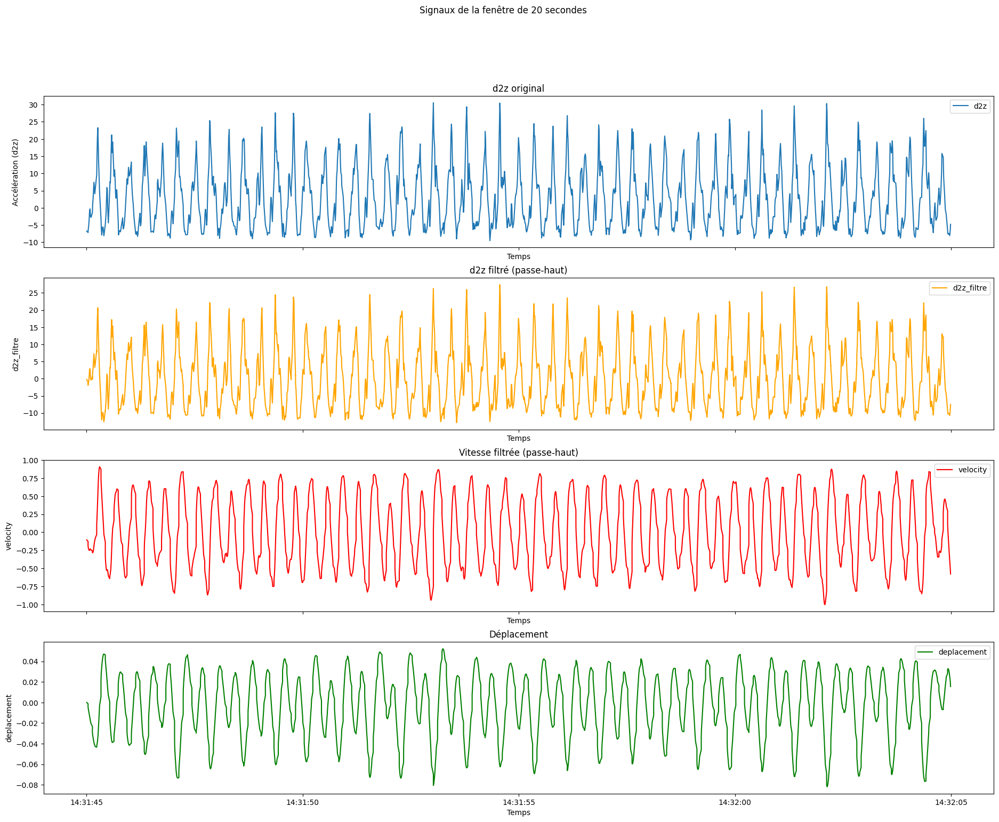

In [429]:
fig, axs = plt.subplots(4, 1, figsize=(23, 17), sharex=True)
axs[0].plot(window_data1.index, window_data1['d2z'], label='d2z')
axs[0].set_ylabel('Accélération (d2z)')
axs[0].legend()
axs[0].title.set_text('d2z original')
axs[0].set_xlabel('Temps')

axs[1].plot(window_data1.index, window_data1['d2z_filtre'], label='d2z_filtre', color='orange')
axs[1].set_ylabel('d2z_filtre')
axs[1].legend()
axs[1].title.set_text('d2z filtré (passe-haut)')
axs[1].set_xlabel('Temps')

axs[2].plot(window_data1.index, window_data1['velocity'], label='velocity', color='red')
axs[2].set_ylabel('velocity')
axs[2].legend()
axs[2].title.set_text('Vitesse filtrée (passe-haut)')
axs[2].set_xlabel('Temps')

axs[3].plot(window_data1.index, window_data1['deplacement'], label='deplacement', color='green')
axs[3].set_ylabel('deplacement')
axs[3].legend()
axs[3].title.set_text('Déplacement')
axs[3].set_xlabel('Temps')

plt.xlabel('Temps')
plt.suptitle('Signaux de la fenêtre de 20 secondes')
plt.show()


### <span style="color:#C23028">Calcul des foulées</span>
#### **Trouver les pics dans le signal de déplacement** 
Les pics de deplacements correspondent aux foulées du cheval.

In [430]:
def trouver_foulees(displacement, prominence=0.01):
    peaks, _ = find_peaks(displacement, prominence=prominence)
    if len(peaks) >= 2:
        return peaks[0], peaks[1]
    else:
        return None, None

In [431]:
def afficher_foulees(displacement, peak1, peak2, time_index_displacement):
    
    plt.figure(figsize=(10, 4))
    
    plt.plot(time_index_displacement, displacement, label='Déplacement', color='green')
    
    plt.plot(time_index_displacement[peak1], displacement[peak1], 'ro', label='Pic maximum d\'une foulée')
    plt.plot(time_index_displacement[peak2], displacement[peak2], 'bo', label='Pic minimum d\'une foulée')
    
    plt.title('Foulées du cheval')
    plt.xlabel('Temps')
    plt.ylabel('Déplacement')
    plt.legend()
    plt.grid(True)
    
    plt.xlim(time_index_displacement[peak1] - pd.Timedelta(seconds=2), time_index_displacement[peak2] + pd.Timedelta(seconds=2))
    
    plt.show()

In [432]:
def identifier_foulees(displacement, prominence=0.01):
    peaks, _ = find_peaks(displacement, prominence=prominence)
    troughs, _ = find_peaks(-displacement, prominence=prominence)
    
    min_length = min(len(peaks), len(troughs))
    peaks = peaks[:min_length]
    troughs = troughs[:min_length]
    
    return peaks, troughs, min_length

In [433]:
def identifier_foulees(displacement, prominence=0.01):
    peaks, _ = find_peaks(displacement, prominence=prominence)
    troughs, _ = find_peaks(-displacement, prominence=prominence)
    
    min_length = min(len(peaks), len(troughs))
    peaks = peaks[:min_length]
    troughs = troughs[:min_length]
    
    return peaks, troughs, min_length

/var/folders/dy/p7g7n6253j76sj1k7y99nbv80000gn/T/ipykernel_17124/1520386640.py:7: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/dy/p7g7n6253j76sj1k7y99nbv80000gn/T/ipykernel_17124/1520386640.py:8: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



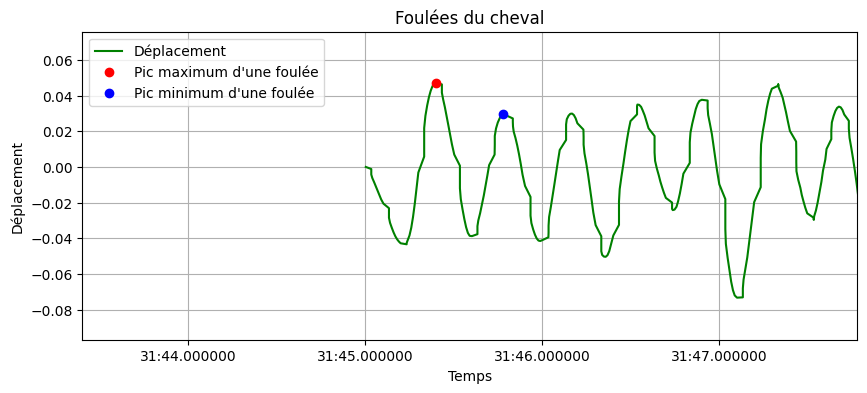

In [434]:
displacement1 = Trot_ligne1_new['deplacement']
time_index_displacement1 = Trot_ligne1_new.index
peak1, peak2 = trouver_foulees(displacement1)
if peak1 is not None and peak2 is not None:
    afficher_foulees(displacement1, peak1, peak2, time_index_displacement1)
else:
    print("Unable to find a stride within the signal based on the given prominence.")

### <span style="color:#C23028">Calcul des ISG</span>
Pour identifier les foulées, on doit trouver les pics de grande amplitude et les pics de petite amplitude sur le signal de déplacement.   
  
ISG = indice de symétrie     
Plus il est proche de 100, plus le cheval est symétrique et donc non boiteux.    
          
$ISG = (A2)^2 /((A1)^2 + (A2)^2) * 100$  
A1 & A2 les deux premiers coefficients de Fourier du déplacement z    

In [435]:
peaks, troughs, min_length = identifier_foulees(displacement1)

#### **Liste des ISG et des harmoniques pour chaque foulée**

In [436]:
def calculate_ISG(min_length, troughs, displacement):
    ISGs = []
    A1_values = []
    A2_values = []
    for i in range(min_length - 2):
        # La foulée est entre un trou (troughs[i]) et le trou d'apres (troughs[i+2])
        stride = displacement[troughs[i]:troughs[i+2]]

        # Tranformée de fourier de la foulée
        stride_fft = np.fft.rfft(stride)  
        # Removing the mean for zero-centering
        stride_fft_magnitude = np.abs(stride_fft)

        # coefficient de fourier (A1 et A2) : premiere et deuxieme harmonique
        A1 = stride_fft_magnitude[1]  
        A2 = stride_fft_magnitude[2]  

        # calculer ISG pour chaque foulée
        ISG = (A2**2 / (A1**2 + A2**2)) * 100
        ISGs.append(ISG)
        A1_values.append(A1)
        A2_values.append(A2)
    #supprimer les trois derniers ISGs, A1_values, A2_values
    
    return ISGs, A1_values, A2_values

In [437]:
def print_values(A1, A2, ISG):
    print("A1: {:.6f} | A2: {:.6f} | ISG: {:.6f}".format(A1, A2, ISG))

In [438]:
ISGs1, A1, A2 = calculate_ISG(min_length, troughs, displacement1)

for i in range(len(ISGs1)):
    print_values(A1[i], A2[i], ISGs1[i])

A1: 0.281506 | A2: 1.559755 | ISG: 96.845428
A1: 0.094891 | A2: 1.395536 | ISG: 99.539785
A1: 0.292811 | A2: 1.391029 | ISG: 95.757000
A1: 0.557208 | A2: 1.439293 | ISG: 86.965802
A1: 0.899410 | A2: 1.741680 | ISG: 78.947000
A1: 0.785653 | A2: 1.686813 | ISG: 82.173712
A1: 0.688260 | A2: 1.481967 | ISG: 82.257871
A1: 0.718264 | A2: 1.378029 | ISG: 78.636390
A1: 0.624892 | A2: 1.459518 | ISG: 84.508570
A1: 0.570793 | A2: 1.510040 | ISG: 87.498030
A1: 0.592394 | A2: 1.483213 | ISG: 86.242613
A1: 0.716001 | A2: 1.315232 | ISG: 77.138937
A1: 0.745324 | A2: 1.408319 | ISG: 78.119847
A1: 0.730587 | A2: 1.415992 | ISG: 78.975916
A1: 0.667913 | A2: 1.333136 | ISG: 79.935424
A1: 0.693872 | A2: 1.469799 | ISG: 81.775145
A1: 1.087337 | A2: 1.499884 | ISG: 65.550167
A1: 1.313221 | A2: 1.248455 | ISG: 47.473351
A1: 1.208551 | A2: 1.314758 | ISG: 54.201590
A1: 1.062100 | A2: 1.526337 | ISG: 67.376099
A1: 1.080413 | A2: 1.669007 | ISG: 70.469825
A1: 0.980126 | A2: 1.658580 | ISG: 74.117247
A1: 0.8313

In [439]:
values_list1 = []

In [440]:
def append_values_to_list(A1, A2, ISG, values_list):
    values_list.append({'A1': A1, 'A2': A2, 'ISG': ISG})
    
for i in range(len(ISGs1)):
    append_values_to_list(A1[i], A2[i], ISGs1[i], values_list1)

#### **Création d'un dataframe**

In [441]:
df_ISG1 = pd.DataFrame(values_list1)
df_ISG1.head()

,A1,A2,ISG
0,0.281506,1.559755,96.845428
1,0.094891,1.395536,99.539785
2,0.292811,1.391029,95.757000
3,0.557208,1.439293,86.965802
4,0.899410,1.741680,78.947000


### <span style="color:#C23028">Valeur de l'ISG</span>

In [442]:
df_ISG1.describe()

,A1,A2,ISG
count,118.000000,118.000000,118.000000
mean,0.890455,1.513142,73.940655
std,0.273549,0.131681,11.248176
min,0.094891,1.248455,47.473351
25%,0.710223,1.418374,65.574254
50%,0.916671,1.496832,74.105009
75%,1.092196,1.586573,81.793273
max,1.396826,1.960993,99.539785


ISG de <span style="color:#C23028">**73.940655**</span> pour ce jeu de données

In [443]:
plt.figure(figsize=(10, 4))
px.line(df_ISG1, x=df_ISG1.index, y='ISG', title='ISG pour chaque foulée')

<Figure size 1000x400 with 0 Axes>

#### **Boxplot des ISG pour visualiser les valeurs aberantes**


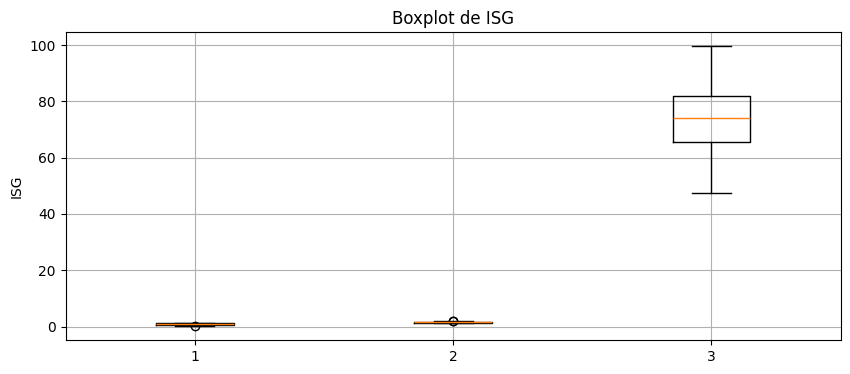

In [444]:
plt.figure(figsize=(10, 4))
plt.boxplot(df_ISG1)
plt.title('Boxplot de ISG')
plt.ylabel('ISG')
plt.grid(True)
plt.show()

Pas de valeurs abérantes a signaler sur le boxplot

## <span style="color:#C23028">**2 - Données au trot en ligne 2**</span>   
 
Relevé de données effectués le 2024-04-13 

### <span style="color:#C23028">Charger les données</span>

In [445]:
Trot_ligne = pd.read_csv('data/Trot_ligne.csv')
Trot_ligne.reset_index(inplace=True)
Trot_ligne.columns = ['time', 'gFx', 'gFy', 'gFz', 'alpha']
Trot_ligne['time'] = Trot_ligne['time'].map(pd.to_datetime)
Trot_ligne.set_index('time', inplace=True)
Trot_ligne.head()

,gFx,gFy,gFz,alpha
time,,,,
2024-04-13 18:49:37.079,0.103,-0.856,-0.512,1.003
2024-04-13 18:49:37.084,0.099,-0.856,-0.509,1.001
2024-04-13 18:49:37.098,0.108,-0.856,-0.509,1.002
2024-04-13 18:49:37.104,0.105,-0.851,-0.515,1.000
2024-04-13 18:49:37.124,0.100,-0.846,-0.508,0.992


In [446]:
Trot_ligne.tail()

,gFx,gFy,gFz,alpha
time,,,,
2024-04-13 18:52:48.771,0.053,-0.777,-0.618,0.994
2024-04-13 18:52:48.781,0.047,-0.782,-0.613,0.995
2024-04-13 18:52:48.791,0.045,-0.781,-0.624,1.001
2024-04-13 18:52:48.801,0.035,-0.770,-0.635,0.999
2024-04-13 18:52:48.811,0.036,-0.768,-0.644,1.003


In [447]:
len(Trot_ligne)

19280


### <span style="color:#C23028">Travail sur les données</span>

#### **Visualisation de alpha pour trier**

In [448]:
plt.figure(figsize=(15, 5))
px.line(Trot_ligne, x=Trot_ligne.index, y='alpha', title='Évolution de alpha en fonction du temps')

<Figure size 1500x500 with 0 Axes>

On peut remarquer un passage au pas entre 18:51:00 et 18:51:15

#### **Filtrer les données**

In [449]:
Trot_ligne_sort = Trot_ligne['2024-04-13 18:49:50.079':'2024-04-13 18:50:51.000']
print(Trot_ligne_sort.head())
print(len(Trot_ligne_sort))

                           gFx    gFy    gFz  alpha
time                                               
2024-04-13 18:49:50.082  1.014 -0.701 -1.399  1.865
2024-04-13 18:49:50.092  0.708 -0.716 -1.682  1.960
2024-04-13 18:49:50.102  0.419 -0.624 -1.606  1.773
2024-04-13 18:49:50.113  0.217 -0.642 -1.379  1.537
2024-04-13 18:49:50.128  0.178 -0.814 -1.113  1.390
6126


#### **Données de la 5ème Colonne (alpha) vs Temps**

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


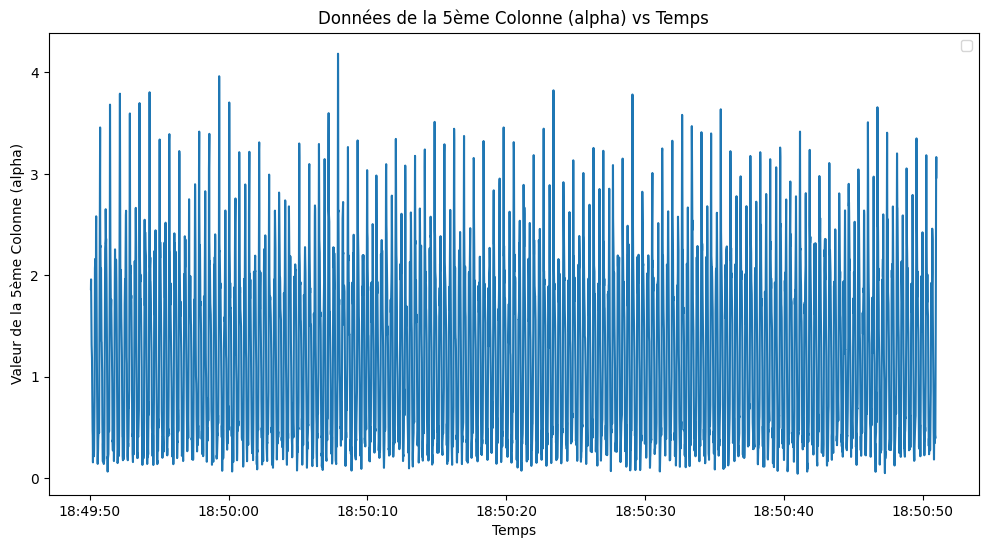

In [450]:
plt.figure(figsize=(12, 6))
plt.plot(Trot_ligne_sort['alpha'])
plt.xlabel("Temps")
plt.ylabel("Valeur de la 5ème Colonne (alpha)")
plt.title("Données de la 5ème Colonne (alpha) vs Temps")
plt.legend()
plt.show()

#### **Données de alpha sur 5 secondes**

In [451]:
start_time2 = pd.Timestamp('2024-04-13 18:50:09.083')
end_time2 = start_time2 + pd.Timedelta(seconds=5)
Trot_ligne_5s = Trot_ligne_sort[start_time2:end_time2]

In [452]:
plt.figure(figsize=(12, 6))
px.line(Trot_ligne_5s, x=Trot_ligne_5s.index, y='alpha', title='Évolution de alpha en fonction du temps (5s)')

<Figure size 1200x600 with 0 Axes>

#### **Calcul de d2Z**
d2Z = (alpha - 1) * 9.81.

In [453]:
# Calculate d2Z = (alpha - 1) * 9.81.
Trot_ligne_new = Trot_ligne_sort.copy()
Trot_ligne_new['d2z'] = (Trot_ligne_new['alpha'] - 1) * 9.81
Trot_ligne_new.head()

,gFx,gFy,gFz,alpha,d2z
time,,,,,
2024-04-13 18:49:50.082,1.014,-0.701,-1.399,1.865,8.48565
2024-04-13 18:49:50.092,0.708,-0.716,-1.682,1.960,9.41760
2024-04-13 18:49:50.102,0.419,-0.624,-1.606,1.773,7.58313
2024-04-13 18:49:50.113,0.217,-0.642,-1.379,1.537,5.26797
2024-04-13 18:49:50.128,0.178,-0.814,-1.113,1.390,3.82590


#### **Données de d2Z en fonction du temps**

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


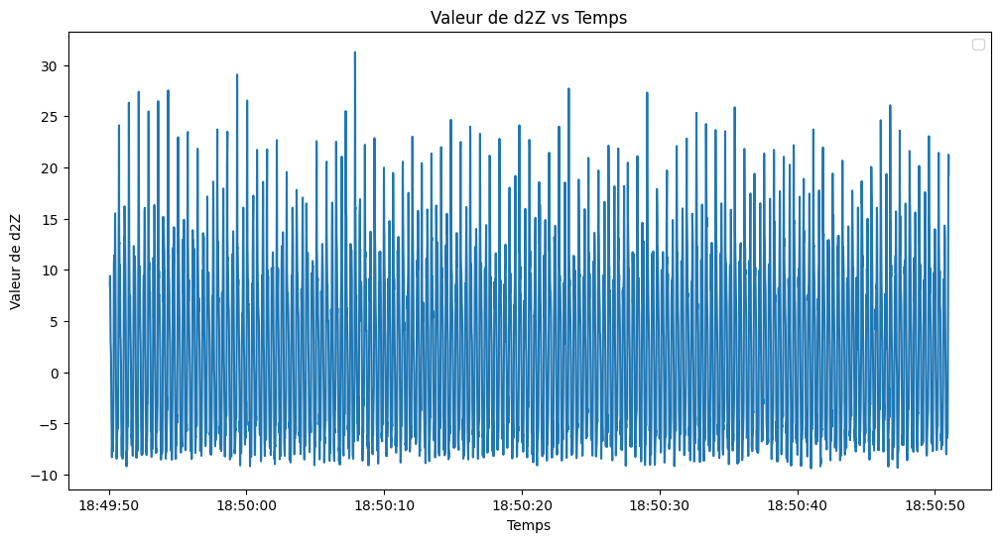

In [454]:
plt.figure(figsize=(12, 6))
plt.plot(Trot_ligne_new['d2z'])
plt.xlabel("Temps")
plt.ylabel("Valeur de d2Z")
plt.title("Valeur de d2Z vs Temps")
plt.legend()
plt.show()

#### **Données de d2z sur 5 secondes**

In [455]:
start_time2 = pd.Timestamp('2024-04-13 18:49:50.079')
end_time2 = start_time2 + pd.Timedelta(seconds=5)
Trot_ligne_5s = Trot_ligne_new[start_time2:end_time2]

In [456]:
plt.figure(figsize=(12, 6))
px.line(Trot_ligne_5s, x=Trot_ligne_5s.index, y='d2z', title='Évolution de d2z en fonction du temps')

<Figure size 1200x600 with 0 Axes>

### <span style="color:#C23028">Calcul du déplacement</span>


#### **Calcul de la fréquence d'échantillonnage à partir des données**
fs = 1 / (Durée médiane entre les échantillons en secondes)

In [457]:
fs2 = 1.0 / (Trot_ligne_new.index.to_series().diff().median().total_seconds())

In [458]:
print("Fréquence d'échantillonnage : ", fs2)

Fréquence d'échantillonnage :  100.0


#### **Étape 1 : Filtrer passe-haut pour retirer la gravité des données d'accélération**

In [459]:
cutoff2 = 1
fs2 = fs2
order2 = 5
b, a = butter_highpass(cutoff2, fs2, order=order2)
Trot_ligne_new['d2z_filtre'] = filtfilt(b, a, Trot_ligne_new['d2z'])

#### **Étape 2 : Intégrer l'accélération filtrée passe-haut pour obtenir la vitesse**

In [460]:
velocity = cumtrapz(Trot_ligne_new['d2z_filtre'], dx=1/fs2, initial=0)

#### **Étape 3 : Filtrer passe-haut la vitesse pour retirer les dérives de basse fréquence**

In [461]:
b, a = butter_highpass(cutoff2, fs2, order=order2)
Trot_ligne_new['velocity'] = filtfilt(b, a, velocity)

#### **Étape 4 : Intégrer la vitesse filtrée passe-haut pour obtenir le déplacement**


In [462]:
Trot_ligne_new['deplacement'] = cumtrapz(Trot_ligne_new['velocity'], dx=1/fs2, initial=0)
Trot_ligne_new.head()

,gFx,gFy,gFz,alpha,d2z,d2z_filtre,velocity,deplacement
time,,,,,,,,
2024-04-13 18:49:50.082,1.014,-0.701,-1.399,1.865,8.48565,-1.115190,0.095935,0.000000
2024-04-13 18:49:50.092,0.708,-0.716,-1.682,1.960,9.41760,0.240224,0.136634,0.001163
2024-04-13 18:49:50.102,0.419,-0.624,-1.606,1.773,7.58313,-1.175838,0.176632,0.002729
2024-04-13 18:49:50.113,0.217,-0.642,-1.379,1.537,5.26797,-3.078283,0.199569,0.004610
2024-04-13 18:49:50.128,0.178,-0.814,-1.113,1.390,3.82590,-4.113953,0.207274,0.006644


#### **Correction de l'index temporel pour correspondre aux dimensions après intégration**

In [463]:
time_index2 = Trot_ligne_new.index
time_index_velocity2 = time_index2[:len(velocity)]
time_index_displacement2 = time_index2[:len(Trot_ligne_new['deplacement'])]

start_20s_window2 = time_index2[0] 
end_20s_window2 = start_20s_window2 + pd.Timedelta(seconds=20)

#### **Visualisation sur une fenetre de 20 secondes**

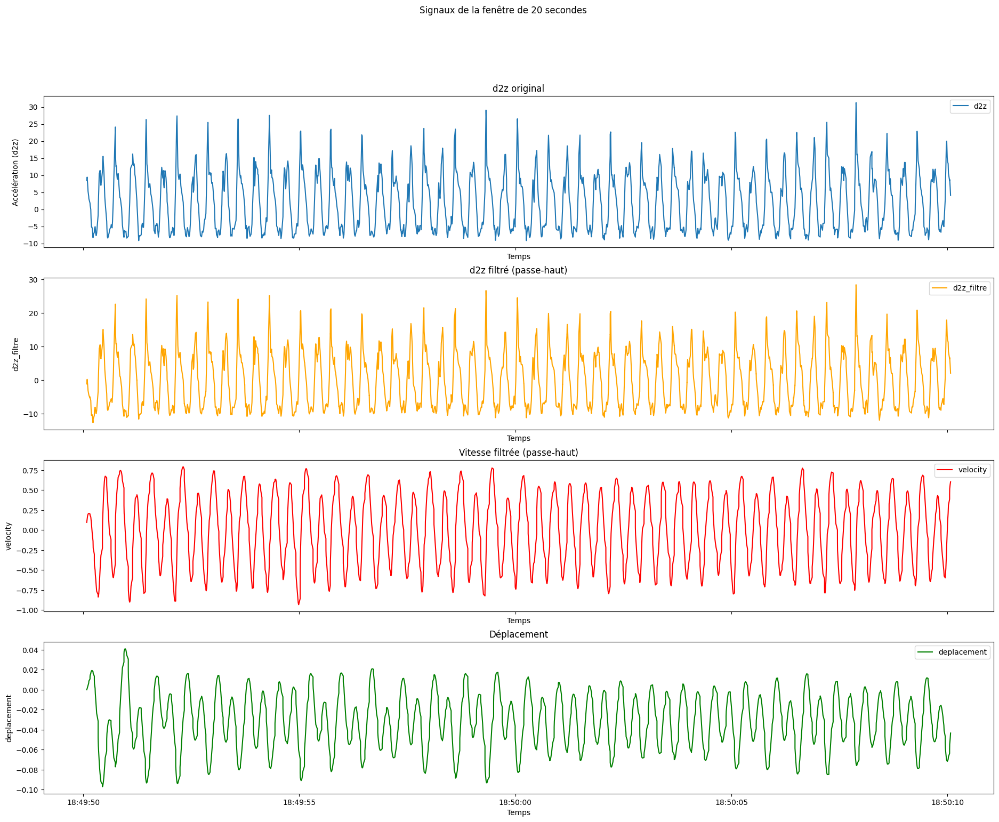

In [464]:
window_data2 = Trot_ligne_new[(Trot_ligne_new.index >= start_20s_window2) & (Trot_ligne_new.index <= end_20s_window2)]

fig, axs = plt.subplots(4, 1, figsize=(23, 17), sharex=True)
axs[0].plot(window_data2.index, window_data2['d2z'], label='d2z')
axs[0].set_ylabel('Accélération (d2z)')
axs[0].legend()
axs[0].title.set_text('d2z original')
axs[0].set_xlabel('Temps')

axs[1].plot(window_data2.index, window_data2['d2z_filtre'], label='d2z_filtre', color='orange')
axs[1].set_ylabel('d2z_filtre')
axs[1].legend()
axs[1].title.set_text('d2z filtré (passe-haut)')
axs[1].set_xlabel('Temps')

axs[2].plot(window_data2.index, window_data2['velocity'], label='velocity', color='red')
axs[2].set_ylabel('velocity')
axs[2].legend()
axs[2].title.set_text('Vitesse filtrée (passe-haut)')
axs[2].set_xlabel('Temps')

axs[3].plot(window_data2.index, window_data2['deplacement'], label='deplacement', color='green')
axs[3].set_ylabel('deplacement')
axs[3].legend()
axs[3].title.set_text('Déplacement')
axs[3].set_xlabel('Temps')

plt.xlabel('Temps')
plt.suptitle('Signaux de la fenêtre de 20 secondes')
plt.show()


### <span style="color:#C23028">Calcul des foulées</span>
#### **Trouver les pics dans le signal de déplacement** 
Les pics de deplacements correspondent aux foulées du cheval.

/var/folders/dy/p7g7n6253j76sj1k7y99nbv80000gn/T/ipykernel_17124/1520386640.py:7: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/dy/p7g7n6253j76sj1k7y99nbv80000gn/T/ipykernel_17124/1520386640.py:8: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



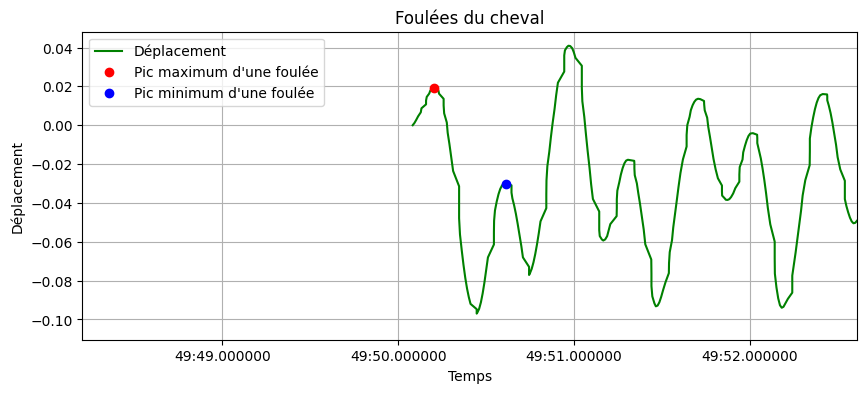

In [465]:
displacement2 = Trot_ligne_new['deplacement']
time_index_displacement2 = Trot_ligne_new.index
peak1, peak2 = trouver_foulees(displacement2)
if peak1 is not None and peak2 is not None:
    afficher_foulees(displacement2, peak1, peak2, time_index_displacement2)
else:
    print("Unable to find a stride within the signal based on the given prominence.")

### <span style="color:#C23028">Calcul des ISG</span>
Pour identifier les foulées, on doit trouver les pics de grande amplitude et les pics de petite amplitude sur le signal de déplacement.

In [466]:
peaks, troughs, min_length = identifier_foulees(displacement2)

#### **Liste des ISG et des harmoniques pour chaque foulée**

In [467]:
ISGs2, A1, A2 = calculate_ISG(min_length, troughs, displacement2)

for i in range(len(ISGs2)):
    print_values(A1[i], A2[i], ISGs2[i])

A1: 1.509935 | A2: 1.360365 | ISG: 44.803175
A1: 1.323199 | A2: 1.345411 | ISG: 50.832310
A1: 1.040984 | A2: 1.122180 | ISG: 53.748315
A1: 1.035396 | A2: 1.200197 | ISG: 57.331860
A1: 0.974916 | A2: 1.297933 | ISG: 63.930614
A1: 0.906928 | A2: 1.329279 | ISG: 68.236438
A1: 0.743920 | A2: 1.265725 | ISG: 74.325108
A1: 0.704441 | A2: 1.210217 | ISG: 74.692932
A1: 0.634925 | A2: 1.185191 | ISG: 77.700625
A1: 0.533962 | A2: 1.341369 | ISG: 86.321370
A1: 0.463738 | A2: 1.271944 | ISG: 88.267041
A1: 0.564008 | A2: 1.313815 | ISG: 84.438781
A1: 0.784159 | A2: 1.438792 | ISG: 77.098743
A1: 0.827808 | A2: 1.201817 | ISG: 67.822320
A1: 0.799933 | A2: 1.203653 | ISG: 69.363653
A1: 0.828225 | A2: 1.161733 | ISG: 66.301694
A1: 0.844090 | A2: 1.186547 | ISG: 66.398162
A1: 0.810938 | A2: 1.217555 | ISG: 69.270960
A1: 0.657597 | A2: 1.026348 | ISG: 70.896050
A1: 0.660732 | A2: 1.156343 | ISG: 75.386608
A1: 0.768097 | A2: 1.266400 | ISG: 73.106573
A1: 0.812836 | A2: 1.204863 | ISG: 68.722640
A1: 0.9042

In [468]:
values_list2 = []

In [469]:
for i in range(len(ISGs2)):
    append_values_to_list(A1[i], A2[i], ISGs2[i], values_list2)

#### **Création d'un dataframe**

In [470]:
df_ISG2 = pd.DataFrame(values_list2)
df_ISG2.head()

,A1,A2,ISG
0,1.509935,1.360365,44.803175
1,1.323199,1.345411,50.832310
2,1.040984,1.122180,53.748315
3,1.035396,1.200197,57.331860
4,0.974916,1.297933,63.930614


### <span style="color:#C23028">Valeur de l'ISG</span>

In [471]:
df_ISG2.describe()

,A1,A2,ISG
count,169.000000,169.000000,169.000000
mean,0.596587,1.203086,79.832615
std,0.203118,0.087750,10.165059
min,0.213818,0.933122,44.803175
25%,0.450324,1.153044,73.807088
50%,0.578866,1.205212,81.637674
75%,0.709780,1.261490,88.150344
max,1.509935,1.438792,97.006087


ISG de <span style="color:#C23028">**79.832615**</span> pour ce jeu de données

In [472]:
plt.figure(figsize=(10, 4))
px.line(df_ISG2, x=df_ISG2.index, y='ISG', title='ISG pour chaque foulée')

<Figure size 1000x400 with 0 Axes>

#### **Boxplot des ISG pour visualiser les valeurs aberantes**


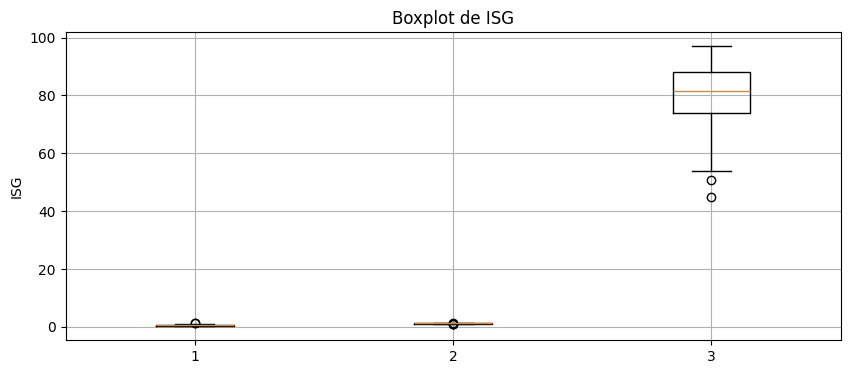

In [473]:
plt.figure(figsize=(10, 4))
plt.boxplot(df_ISG2)
plt.title('Boxplot de ISG')
plt.ylabel('ISG')
plt.grid(True)
plt.show()

#### **Tri des valeurs aberantes**
Les points qui apparaissent en dehors des moustaches représentent des **valeurs aberrantes**.

In [474]:
def ISG_min_max(ISGs, min_value, max_value):
    ISGs_filtered = [ISG for ISG in ISGs if ISG >= min_value and ISG <= max_value]
    return ISGs_filtered

In [475]:
# Supprimer les valeurs aberrantes
min_value2 = 55
max_value2 = 100
ISGs_filtered2 = ISG_min_max(ISGs2, min_value2, max_value2)

In [476]:
plt.figure(figsize=(10, 4))
px.line(ISGs_filtered2, title='ISG pour chaque foulée (Filtré)')

<Figure size 1000x400 with 0 Axes>

Text(0.5, 1.0, 'Boxplot de ISG (Filtré)')

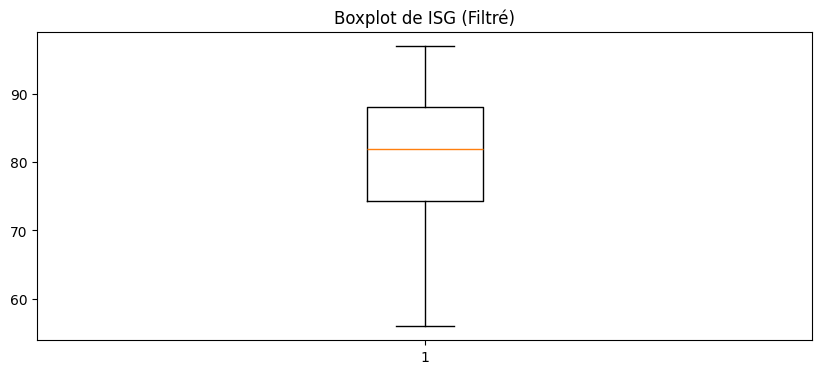

In [477]:
plt.figure(figsize=(10, 4))
plt.boxplot(ISGs_filtered2)
plt.title('Boxplot de ISG (Filtré)')

#### **Les données filtrées**

In [478]:
df_ISG_filtered2 = df_ISG2[(df_ISG2['ISG'] >= min_value2) & (df_ISG2['ISG'] <= max_value2)]
df_ISG_filtered2.describe()

,A1,A2,ISG
count,166.000000,166.000000,166.000000
mean,0.584031,1.201768,80.375471
std,0.179989,0.086753,9.394320
min,0.213818,0.933122,55.955094
25%,0.448469,1.153114,74.271849
50%,0.574456,1.205038,81.934572
75%,0.705057,1.258645,88.168159
max,1.035396,1.438792,97.006087


Apres un filtre des données, l'ISG moyen est de <span style="color:#C23028">**80.375471**</span>

## <span style="color:#C23028">**3 - Données au trot en cercle à droite**</span>   
Relevé de données effectués le 2024-01-01    
En cercle à droite, le téléphone est à l'extérieur du cercle

### <span style="color:#C23028">Charger les données</span>

In [479]:
Trot_droit = pd.read_csv('data/Trot_Droit_Cercle.csv')
Trot_droit.reset_index(inplace=True)
Trot_droit.columns = ['time', 'gFx', 'gFy', 'gFz', 'alpha']
Trot_droit['time'] = Trot_droit['time'].map(pd.to_datetime)
Trot_droit.set_index('time', inplace=True)
Trot_droit.head()

,gFx,gFy,gFz,alpha
time,,,,
2024-01-01 15:14:07.885,0.070,-0.741,-0.666,0.999
2024-01-01 15:14:07.886,0.070,-0.741,-0.666,0.999
2024-01-01 15:14:07.893,0.078,-0.744,-0.662,0.999
2024-01-01 15:14:07.903,0.088,-0.742,-0.658,0.996
2024-01-01 15:14:07.913,0.095,-0.743,-0.656,0.996


In [480]:
Trot_droit.tail()

,gFx,gFy,gFz,alpha
time,,,,
2024-01-01 15:19:18.875,0.041,-0.734,-0.672,0.996
2024-01-01 15:19:18.887,0.028,-0.718,-0.696,1.000
2024-01-01 15:19:18.895,0.030,-0.707,-0.711,1.003
2024-01-01 15:19:18.910,0.009,-0.688,-0.735,1.007
2024-01-01 15:19:18.915,-0.009,-0.689,-0.732,1.005


### <span style="color:#C23028">Travail sur les données</span>

#### **Visualisation de alpha pour trier**

In [481]:
plt.figure(figsize=(15, 5))
px.line(Trot_droit, x=Trot_droit.index, y='alpha', title='Évolution de alpha en fonction du temps')

<Figure size 1500x500 with 0 Axes>

#### **Filtrer les données**

In [482]:
Trot_droit_sort = Trot_droit['2024-01-01 15:14:30.000':'2024-01-01 15:18:30.000']
Trot_droit_sort.head() 


,gFx,gFy,gFz,alpha
time,,,,
2024-01-01 15:14:30.004,-0.871,-1.959,-0.718,2.261
2024-01-01 15:14:30.034,0.575,-1.166,-1.257,1.808
2024-01-01 15:14:30.035,0.575,-1.166,-1.257,1.808
2024-01-01 15:14:30.035,0.575,-1.166,-1.257,1.808
2024-01-01 15:14:30.043,0.893,-1.037,-1.156,1.791


#### **Données de alpha vs Temps**

In [483]:
plt.figure(figsize=(12, 6))
px.line(Trot_droit_sort, x=Trot_droit_sort.index, y='alpha', title='Évolution de alpha en fonction du temps')

<Figure size 1200x600 with 0 Axes>

#### **Données de alpha sur 5 secondes**

In [484]:
start_time3 = Trot_droit_sort.index.min()
end_time3 = start_time3 + pd.Timedelta(seconds=5)
Trot_droit_sort_5s = Trot_droit_sort[start_time3:end_time3]

In [485]:
plt.figure(figsize=(12, 6))
px.line(Trot_droit_sort_5s, x=Trot_droit_sort_5s.index, y='alpha', title='Évolution de alpha en fonction du temps (5s)')

<Figure size 1200x600 with 0 Axes>

#### **Calcul de d2Z**
d2Z = (alpha - 1) * 9.81.

In [486]:
Trot_droit_new = Trot_droit_sort.copy()
Trot_droit_new['d2z'] = (Trot_droit_new['alpha'] - 1) * 9.81
Trot_droit_new.head()

,gFx,gFy,gFz,alpha,d2z
time,,,,,
2024-01-01 15:14:30.004,-0.871,-1.959,-0.718,2.261,12.37041
2024-01-01 15:14:30.034,0.575,-1.166,-1.257,1.808,7.92648
2024-01-01 15:14:30.035,0.575,-1.166,-1.257,1.808,7.92648
2024-01-01 15:14:30.035,0.575,-1.166,-1.257,1.808,7.92648
2024-01-01 15:14:30.043,0.893,-1.037,-1.156,1.791,7.75971


#### **Tracer d2Z en fonction du temps**


In [487]:
plt.figure(figsize=(12, 6))
px.line(Trot_droit_new, x=Trot_droit_new.index, y='d2z', title='Évolution de d2z en fonction du temps')

<Figure size 1200x600 with 0 Axes>

#### **Données de d2Z sur 5 secondes**

In [488]:
start_time3 = Trot_droit_new.index.min()
end_time3 = start_time3 + pd.Timedelta(seconds=5)
Trot_droit_new_5s = Trot_droit_new[start_time3:end_time3]

In [489]:
plt.figure(figsize=(12, 6))
px.line(Trot_droit_new_5s, x=Trot_droit_new_5s.index, y='d2z', title='Évolution de d2z en fonction du temps (5s)')

<Figure size 1200x600 with 0 Axes>

### <span style="color:#C23028">Calcul du déplacement</span>

#### **Calcul de la fréquence d'échantillonnage à partir des données**

In [490]:
fs3 = 1.0 / (Trot_droit_new.index.to_series().diff().median().total_seconds())

In [491]:
print("Fréquence d'échantillonnage : ", fs3)

Fréquence d'échantillonnage :  100.0


#### **Étape 1 : Filtrer passe-haut pour retirer la gravité des données d'accélération**

In [492]:
cutoff3 = 1
fs3 = fs3
order3 = 5
b, a = butter_highpass(cutoff3, fs3, order=order3)
Trot_droit_new['d2z_filtre'] = filtfilt(b, a, Trot_droit_new['d2z'])

#### **Étape 2 : Intégrer l'accélération filtrée passe-haut pour obtenir la vitesse**

In [493]:
velocity = cumtrapz(Trot_droit_new['d2z_filtre'], dx=1/fs3, initial=0)

#### **Étape 3 : Filtrer passe-haut la vitesse pour retirer les dérives de basse fréquence**

In [494]:
b, a = butter_highpass(cutoff3, fs3, order=order3)
Trot_droit_new['velocity'] = filtfilt(b, a, velocity)

#### **Étape 4 : Intégrer la vitesse filtrée passe-haut pour obtenir le déplacement**


In [495]:
Trot_droit_new['deplacement'] = cumtrapz(Trot_droit_new['velocity'], dx=1/fs3, initial=0)
Trot_droit_new.head()

,gFx,gFy,gFz,alpha,d2z,d2z_filtre,velocity,deplacement
time,,,,,,,,
2024-01-01 15:14:30.004,-0.871,-1.959,-0.718,2.261,12.37041,0.244910,0.133267,0.000000
2024-01-01 15:14:30.034,0.575,-1.166,-1.257,1.808,7.92648,-3.757422,0.126081,0.001297
2024-01-01 15:14:30.035,0.575,-1.166,-1.257,1.808,7.92648,-3.319735,0.101239,0.002433
2024-01-01 15:14:30.035,0.575,-1.166,-1.257,1.808,7.92648,-2.886554,0.080900,0.003344
2024-01-01 15:14:30.043,0.893,-1.037,-1.156,1.791,7.75971,-2.625231,0.064160,0.004069


#### **Correction de l'index temporel pour correspondre aux dimensions après intégration**

In [496]:
time_index3 = Trot_droit_new.index
time_index_velocity3 = time_index3[:len(velocity)]
time_index_displacement3 = time_index3[:len(Trot_droit_new['deplacement'])]

start_20s_window3 = time_index3[0] 
end_20s_window3 = start_20s_window3 + pd.Timedelta(seconds=20)

#### **Visualisation sur une fenetre de 20 secondes**

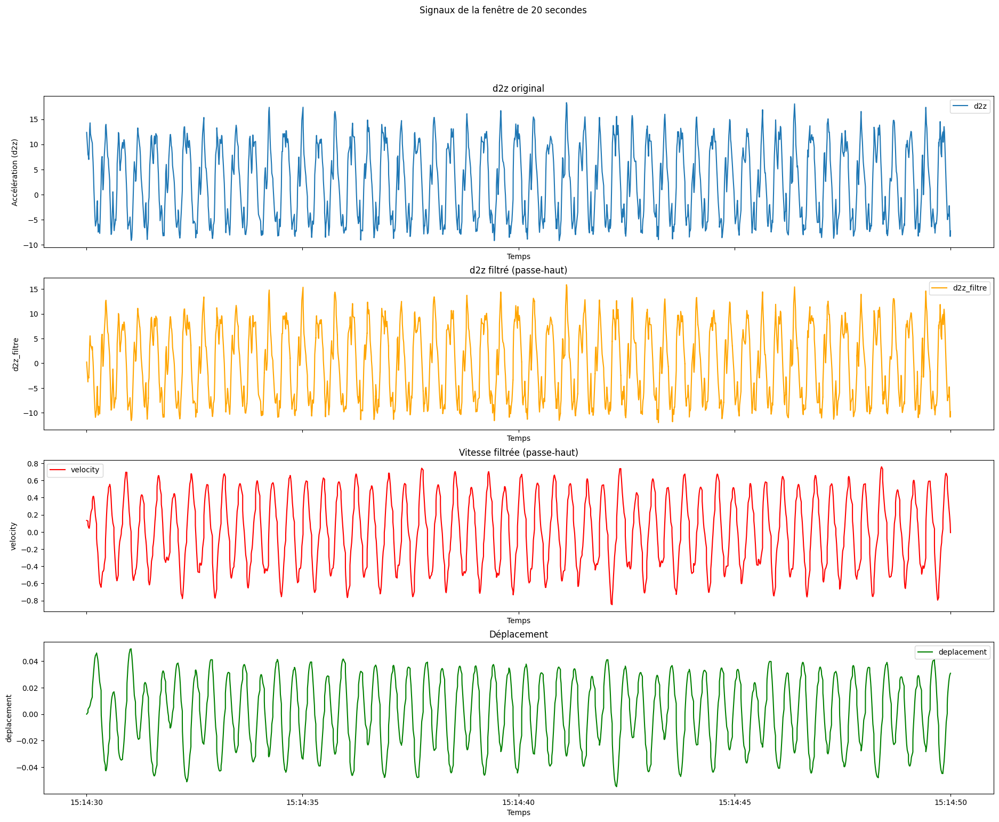

In [497]:
# Tracé des signaux d2z, d2z_filtre, velocity, deplacement de la fenêtre de 20 secondes uniquement
window_data3 = Trot_droit_new[(Trot_droit_new.index >= start_20s_window3) & (Trot_droit_new.index <= end_20s_window3)]


fig, axs = plt.subplots(4, 1, figsize=(23, 17), sharex=True)
axs[0].plot(window_data3.index, window_data3['d2z'], label='d2z')
axs[0].set_ylabel('Accélération (d2z)')
axs[0].legend()
axs[0].title.set_text('d2z original')
axs[0].set_xlabel('Temps')

axs[1].plot(window_data3.index, window_data3['d2z_filtre'], label='d2z_filtre', color='orange')
axs[1].set_ylabel('d2z_filtre')
axs[1].legend()
axs[1].title.set_text('d2z filtré (passe-haut)')
axs[1].set_xlabel('Temps')

axs[2].plot(window_data3.index, window_data3['velocity'], label='velocity', color='red')
axs[2].set_ylabel('velocity')
axs[2].legend()
axs[2].title.set_text('Vitesse filtrée (passe-haut)')
axs[2].set_xlabel('Temps')

axs[3].plot(window_data3.index, window_data3['deplacement'], label='deplacement', color='green')
axs[3].set_ylabel('deplacement')
axs[3].legend()
axs[3].title.set_text('Déplacement')
axs[3].set_xlabel('Temps')

plt.xlabel('Temps')
plt.suptitle('Signaux de la fenêtre de 20 secondes')
plt.show()


### <span style="color:#C23028">Calcul des foulées</span>
#### **Trouver les pics dans le signal de déplacement** 
Les pics de deplacements correspondent aux foulées du cheval.

/var/folders/dy/p7g7n6253j76sj1k7y99nbv80000gn/T/ipykernel_17124/1520386640.py:7: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/dy/p7g7n6253j76sj1k7y99nbv80000gn/T/ipykernel_17124/1520386640.py:8: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



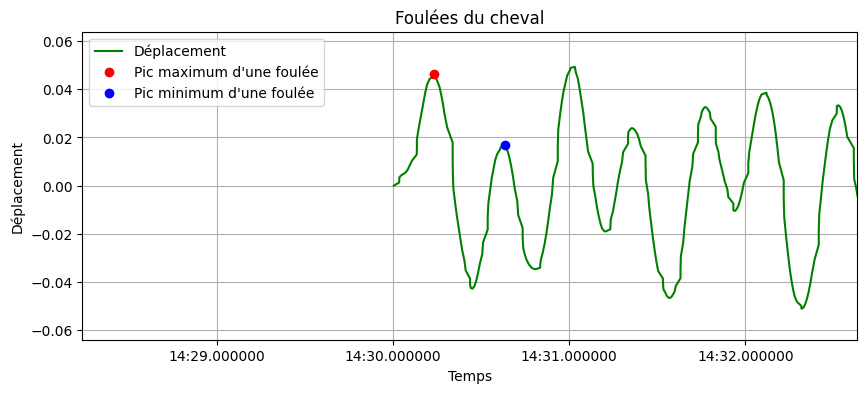

In [498]:
displacement3 = Trot_droit_new['deplacement']
time_index_displacement3 = Trot_droit_new.index
peak1, peak2 = trouver_foulees(displacement3)
if peak1 is not None and peak2 is not None:
    afficher_foulees(displacement3, peak1, peak2, time_index_displacement3)
else:
    print("Unable to find a stride within the signal based on the given prominence.")

### <span style="color:#C23028">Calcul des ISG</span>


In [499]:
peaks, troughs, min_length = identifier_foulees(displacement3)

#### **Liste des ISG et des harmoniques pour chaque foulée**

In [500]:
ISGs3, A1, A2 = calculate_ISG(min_length, troughs, displacement3)

for i in range(len(ISGs3)):
    print_values(A1[i], A2[i], ISGs3[i])

A1: 0.698939 | A2: 1.240083 | ISG: 75.891516
A1: 0.748643 | A2: 1.238705 | ISG: 73.245629
A1: 0.703944 | A2: 1.052106 | ISG: 69.076556
A1: 0.816757 | A2: 1.216737 | ISG: 68.936940
A1: 0.740528 | A2: 1.333697 | ISG: 76.435304
A1: 0.598091 | A2: 1.375213 | ISG: 84.094046
A1: 0.442680 | A2: 1.353905 | ISG: 90.341890
A1: 0.326693 | A2: 1.347250 | ISG: 94.446459
A1: 0.297279 | A2: 1.257692 | ISG: 94.708608
A1: 0.287086 | A2: 1.336657 | ISG: 95.590406
A1: 0.293073 | A2: 1.500849 | ISG: 96.326957
A1: 0.249537 | A2: 1.471015 | ISG: 97.202853
A1: 0.295299 | A2: 1.334943 | ISG: 95.335014
A1: 0.411954 | A2: 1.385066 | ISG: 91.872737
A1: 0.474667 | A2: 1.423121 | ISG: 89.988862
A1: 0.528701 | A2: 1.310348 | ISG: 85.999516
A1: 0.549651 | A2: 1.391768 | ISG: 86.507449
A1: 0.576443 | A2: 1.377058 | ISG: 85.089717
A1: 0.576454 | A2: 1.416456 | ISG: 85.790963
A1: 0.521870 | A2: 1.450615 | ISG: 88.540564
A1: 0.424253 | A2: 1.369611 | ISG: 91.244838
A1: 0.381134 | A2: 1.395743 | ISG: 93.060767
A1: 0.4421

#### **Création d'un dataframe**

In [501]:
values_list3 = []
for i in range(len(ISGs3)):
    append_values_to_list(A1[i], A2[i], ISGs3[i], values_list3)
df_ISG3 = pd.DataFrame(values_list3)
df_ISG3.head()

,A1,A2,ISG
0,0.698939,1.240083,75.891516
1,0.748643,1.238705,73.245629
2,0.703944,1.052106,69.076556
3,0.816757,1.216737,68.936940
4,0.740528,1.333697,76.435304


### <span style="color:#C23028">Valeur de l'ISG</span>

In [502]:
df_ISG3.describe()

,A1,A2,ISG
count,622.000000,622.000000,622.000000
mean,0.441486,1.377915,89.973741
std,0.133383,0.112100,5.575059
min,0.056615,1.015281,63.247965
25%,0.345562,1.314880,86.759237
50%,0.442667,1.377320,90.736798
75%,0.535735,1.449909,93.942718
max,0.834359,1.840437,99.815591


ISG de **89.973741** pour ce jeu de données

In [503]:
plt.figure(figsize=(10, 4))
px.line(df_ISG3, x=df_ISG3.index, y='ISG', title='ISG pour chaque foulée')

<Figure size 1000x400 with 0 Axes>

#### **Boxplot des ISG pour visualiser les valeurs aberantes**


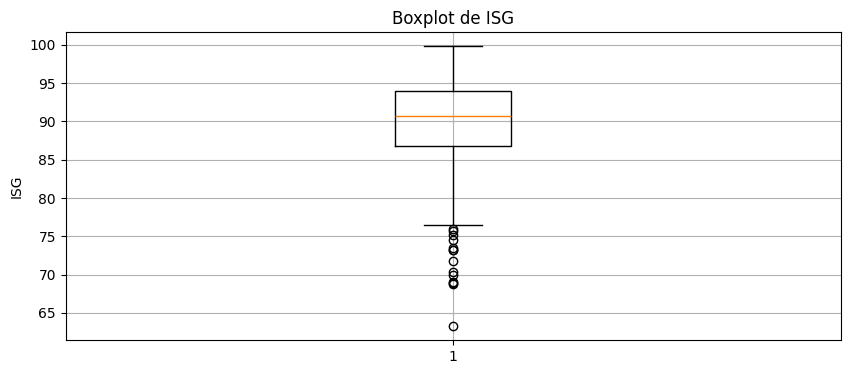

In [504]:
plt.figure(figsize=(10, 4))
plt.boxplot(ISGs3)
plt.title('Boxplot de ISG')
plt.ylabel('ISG')
plt.grid(True)
plt.show()

#### **Tri des valeurs aberantes**
Les points qui apparaissent en dehors des moustaches représentent des **valeurs aberrantes**.

In [505]:
min_value3 = 76
max_value3 = 100
ISGs_filtered3 = ISG_min_max(ISGs3, min_value3, max_value3)

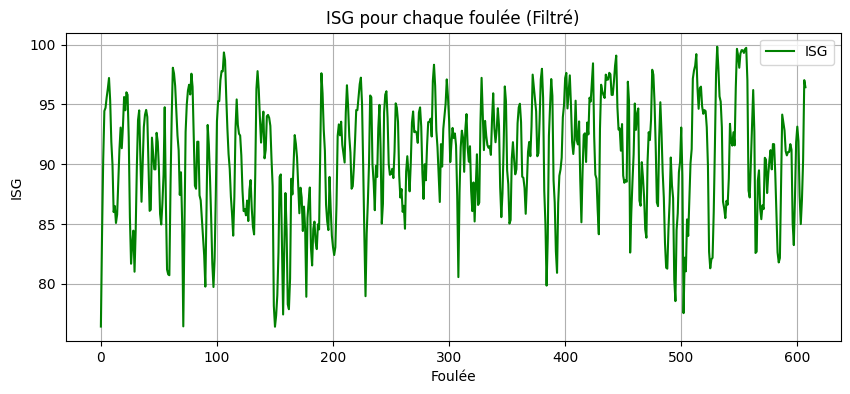

In [506]:
plt.figure(figsize=(10, 4))
plt.plot(np.arange(len(ISGs_filtered3)), ISGs_filtered3, label='ISG', color='green')
plt.title('ISG pour chaque foulée (Filtré)')
plt.xlabel('Foulée')
plt.ylabel('ISG')
plt.legend()
plt.grid(True)

Text(0.5, 1.0, 'Boxplot de ISG (Filtré)')

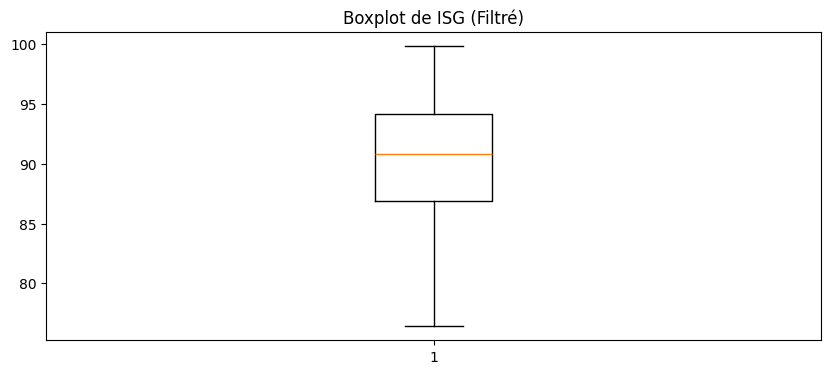

In [507]:
plt.figure(figsize=(10, 4))
plt.boxplot(ISGs_filtered3)
plt.title('Boxplot de ISG (Filtré)')

#### **Les données filtrées**

In [508]:
df_ISG_filtered3 = df_ISG3[(df_ISG3['ISG'] >= min_value3) & (df_ISG3['ISG'] <= max_value3)]
df_ISG_filtered3.describe()

,A1,A2,ISG
count,608.000000,608.000000,608.000000
mean,0.435221,1.383436,90.395185
std,0.128034,0.106547,4.860927
min,0.056615,1.032076,76.421200
25%,0.344562,1.321251,86.929394
50%,0.439514,1.379948,90.848870
75%,0.529467,1.452552,94.122882
max,0.774316,1.840437,99.815591


Apres un filtre des données, l'ISG moyen est de <span style="color:#C23028">**90.725321**</span>

## <span style="color:#C23028">**4 - Données au trot en cercle à gauche**</span>   
Relevé de données effectués le 2024-01-01    
En cercle à gauche, le téléphone est à l'interieux du cercle

### <span style="color:#C23028">Charger les données</span>

In [509]:
Trot_gauche = pd.read_csv('data/Trot_Gauche_Cercle.csv')
Trot_gauche.reset_index(inplace=True)
Trot_gauche.columns = ['time', 'gFx', 'gFy', 'gFz', 'alpha']
Trot_gauche['time'] = Trot_gauche['time'].map(pd.to_datetime)
Trot_gauche.set_index('time', inplace=True)
Trot_gauche.head()

,gFx,gFy,gFz,alpha
time,,,,
2024-01-01 15:03:45.018,0.117,-0.787,-0.608,1.001
2024-01-01 15:03:45.018,0.117,-0.787,-0.608,1.001
2024-01-01 15:03:45.018,0.117,-0.787,-0.608,1.001
2024-01-01 15:03:45.024,0.104,-0.785,-0.616,1.003
2024-01-01 15:03:45.034,0.096,-0.784,-0.609,0.997


In [510]:
Trot_gauche.tail()

,gFx,gFy,gFz,alpha
time,,,,
2024-01-01 15:08:25.834,0.046,-0.738,-0.679,1.004
2024-01-01 15:08:25.844,0.045,-0.742,-0.674,1.003
2024-01-01 15:08:25.875,0.046,-0.733,-0.692,1.009
2024-01-01 15:08:25.875,0.046,-0.733,-0.692,1.009
2024-01-01 15:08:25.876,0.046,-0.733,-0.692,1.009


### <span style="color:#C23028">Travail sur les données</span>

#### **Visualisation de alpha pour trier**

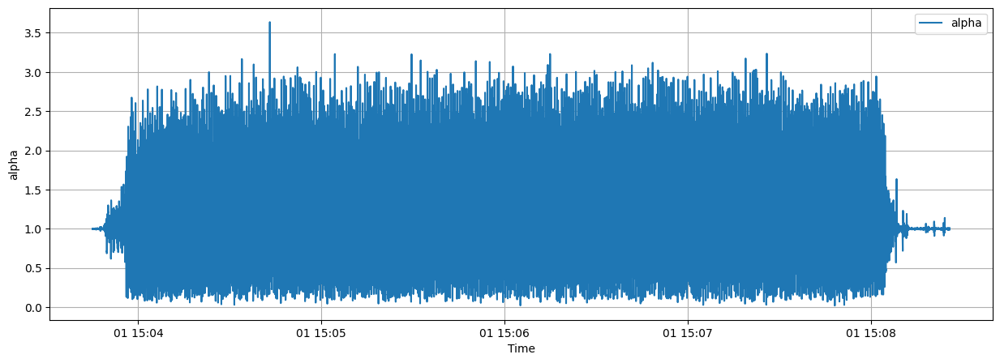

In [511]:
plt.figure(figsize=(15, 5))
plt.plot(Trot_gauche.index, Trot_gauche['alpha'], label='alpha')
plt.xlabel('Time')
plt.ylabel('alpha')
plt.legend()
plt.grid(True)

#### **Filtrer les données**

In [512]:
Trot_gauche_sort = Trot_gauche['2024-01-01 15:04:00.018':'2024-01-01 15:08:00.876']
Trot_gauche_sort.head()


,gFx,gFy,gFz,alpha
time,,,,
2024-01-01 15:04:00.030,0.001,-0.341,-0.702,0.780
2024-01-01 15:04:00.031,0.001,-0.341,-0.702,0.780
2024-01-01 15:04:00.038,-0.118,-0.320,-0.619,0.707
2024-01-01 15:04:00.051,-0.229,-0.243,-0.489,0.592
2024-01-01 15:04:00.058,-0.255,-0.186,-0.254,0.405


#### **Données de alpha vs Temps**

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


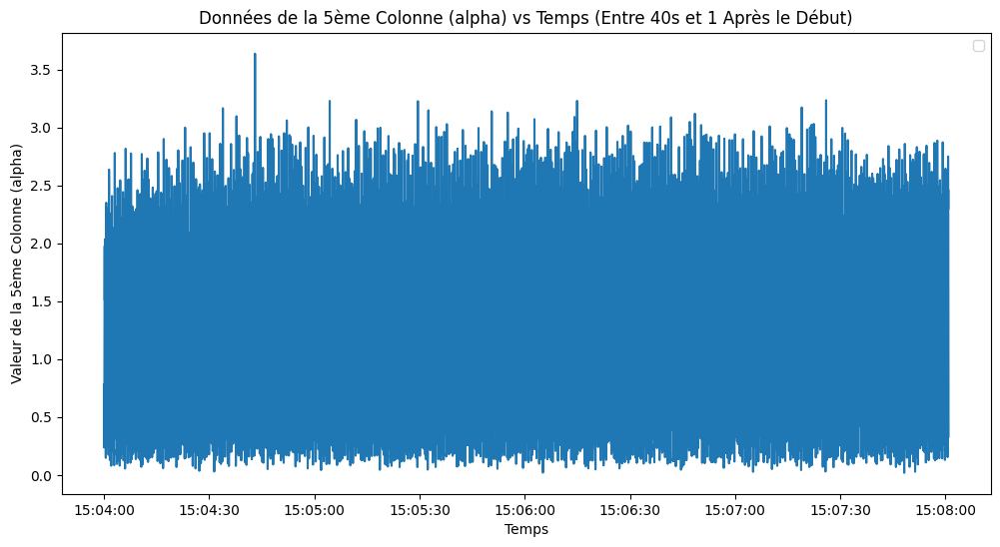

In [513]:
plt.figure(figsize=(12, 6))
plt.plot(Trot_gauche_sort['alpha'])
plt.xlabel("Temps")
plt.ylabel("Valeur de la 5ème Colonne (alpha)")
plt.title("Données de la 5ème Colonne (alpha) vs Temps (Entre 40s et 1 Après le Début)")
plt.legend()
plt.show()

#### **Données de alpha sur 5 secondes**

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


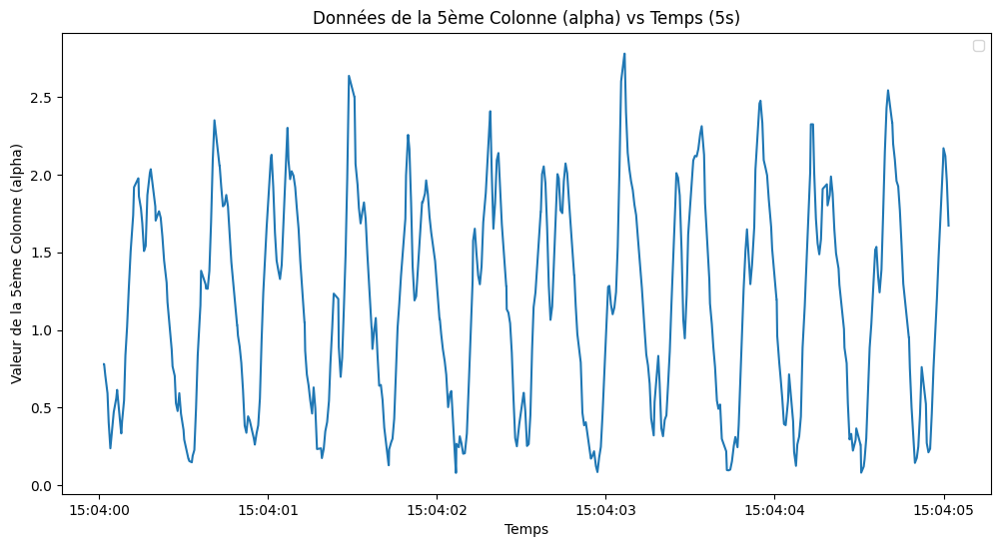

In [514]:
start_time4 = Trot_gauche_sort.index.min()
end_time4 = start_time4 + pd.Timedelta(seconds=5)
Trot_gauche_sort_5s = Trot_gauche_sort[start_time4:end_time4]

plt.figure(figsize=(12, 6))
plt.plot(Trot_gauche_sort_5s['alpha'])
plt.xlabel("Temps")
plt.ylabel("Valeur de la 5ème Colonne (alpha)")
plt.title("Données de la 5ème Colonne (alpha) vs Temps (5s)")
plt.legend()
plt.show()

#### **Calcul de d2Z**
d2Z = (alpha - 1) * 9.81.

In [515]:
# Calculate d2Z = (alpha - 1) * 9.81.
Trot_gauche_new = Trot_gauche_sort.copy()
Trot_gauche_new['d2z'] = (Trot_gauche_new['alpha'] - 1) * 9.81
Trot_gauche_new.head()

,gFx,gFy,gFz,alpha,d2z
time,,,,,
2024-01-01 15:04:00.030,0.001,-0.341,-0.702,0.780,-2.15820
2024-01-01 15:04:00.031,0.001,-0.341,-0.702,0.780,-2.15820
2024-01-01 15:04:00.038,-0.118,-0.320,-0.619,0.707,-2.87433
2024-01-01 15:04:00.051,-0.229,-0.243,-0.489,0.592,-4.00248
2024-01-01 15:04:00.058,-0.255,-0.186,-0.254,0.405,-5.83695


#### **Tracer d2Z en fonction du temps**


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


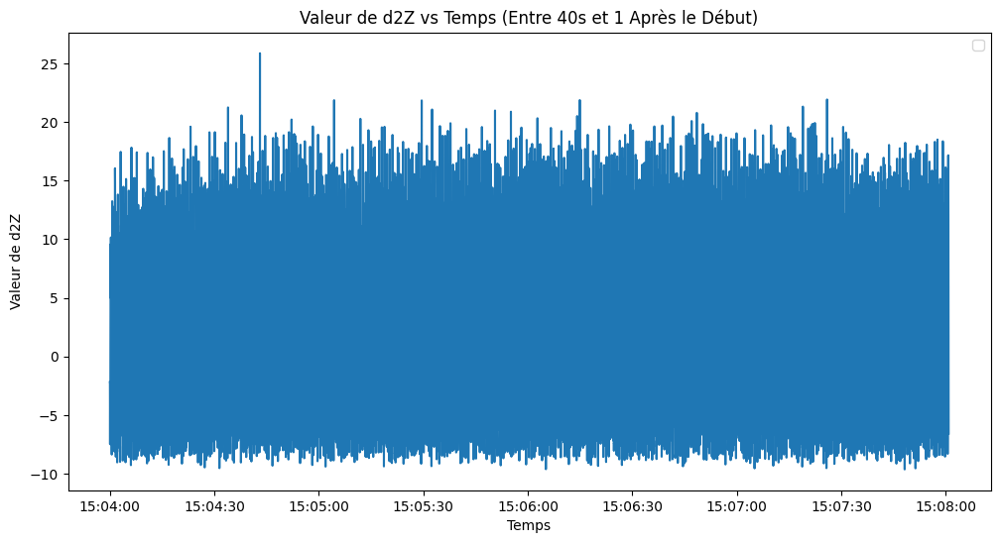

In [516]:
plt.figure(figsize=(12, 6))
plt.plot(Trot_gauche_new['d2z'])
plt.xlabel("Temps")
plt.ylabel("Valeur de d2Z")
plt.title("Valeur de d2Z vs Temps (Entre 40s et 1 Après le Début)")
plt.legend()
plt.show()

#### **Données de d2Z sur 5 secondes**

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


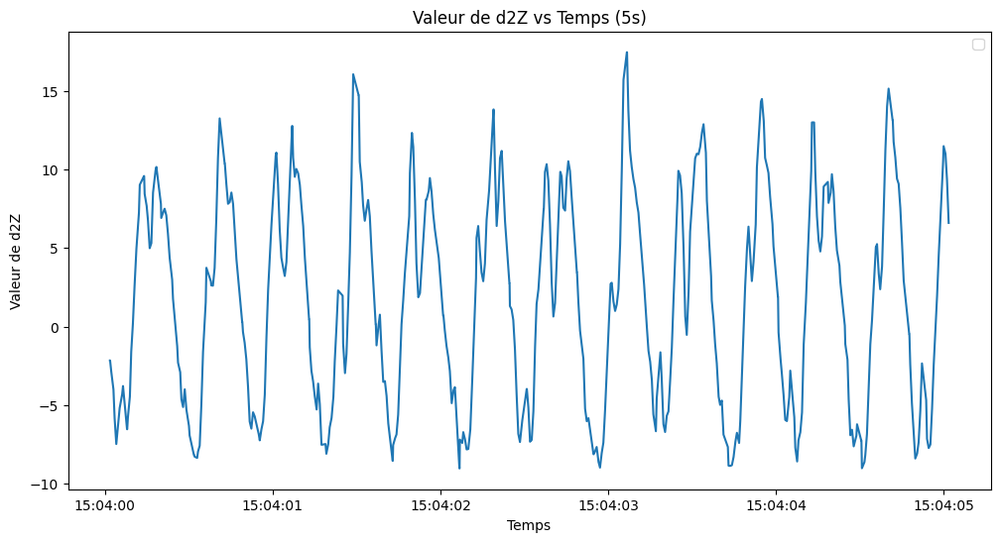

In [517]:
start_time4 = Trot_gauche_new.index.min()
end_time4 = start_time4 + pd.Timedelta(seconds=5)
Trot_gauche_new_5s = Trot_gauche_new[start_time4:end_time4]

plt.figure(figsize=(12, 6))
plt.plot(Trot_gauche_new_5s['d2z'])
plt.xlabel("Temps")
plt.ylabel("Valeur de d2Z")
plt.title("Valeur de d2Z vs Temps (5s)")
plt.legend()
plt.show()

### <span style="color:#C23028">Calcul du déplacement</span>

#### **Calcul de la fréquence d'échantillonnage à partir des données**

In [518]:
fs4 = 1.0 / (Trot_gauche_new.index.to_series().diff().median().total_seconds())

In [519]:
print("Fréquence d'échantillonnage : ", fs4)

Fréquence d'échantillonnage :  100.0


#### **Étape 1 : Filtrer passe-haut pour retirer la gravité des données d'accélération**

In [520]:
cutoff4 = 1
fs4 = fs4
order4 = 5
b, a = butter_highpass(cutoff4, fs4, order=order4)
Trot_gauche_new['d2z_filtre'] = filtfilt(b, a, Trot_gauche_new['d2z'])

#### **Étape 2 : Intégrer l'accélération filtrée passe-haut pour obtenir la vitesse**

In [521]:
velocity = cumtrapz(Trot_gauche_new['d2z_filtre'], dx=1/fs4, initial=0)

#### **Étape 3 : Filtrer passe-haut la vitesse pour retirer les dérives de basse fréquence**

In [522]:
b, a = butter_highpass(cutoff4, fs4, order=order4)
Trot_gauche_new['velocity'] = filtfilt(b, a, velocity)

#### **Étape 4 : Intégrer la vitesse filtrée passe-haut pour obtenir le déplacement**


In [523]:
Trot_gauche_new['deplacement'] = cumtrapz(Trot_gauche_new['velocity'], dx=1/fs4, initial=0)
Trot_gauche_new.head()

,gFx,gFy,gFz,alpha,d2z,d2z_filtre,velocity,deplacement
time,,,,,,,,
2024-01-01 15:04:00.030,0.001,-0.341,-0.702,0.780,-2.15820,-0.179675,-0.126557,0.000000
2024-01-01 15:04:00.031,0.001,-0.341,-0.702,0.780,-2.15820,-0.409435,-0.118838,-0.001227
2024-01-01 15:04:00.038,-0.118,-0.320,-0.619,0.707,-2.87433,-1.350684,-0.117144,-0.002407
2024-01-01 15:04:00.051,-0.229,-0.243,-0.489,0.592,-4.00248,-2.699022,-0.127077,-0.003628
2024-01-01 15:04:00.058,-0.255,-0.186,-0.254,0.405,-5.83695,-4.748473,-0.154188,-0.005034


#### **Correction de l'index temporel pour correspondre aux dimensions après intégration**

In [524]:
time_index4 = Trot_gauche_new.index
time_index_velocity4 = time_index4[:len(velocity)]
time_index_displacement4 = time_index4[:len(Trot_gauche_new['deplacement'])]

start_20s_window4 = time_index4[0] 
end_20s_window4 = start_20s_window4 + pd.Timedelta(seconds=20)

#### **Visualisation sur une fenetre de 20 secondes**

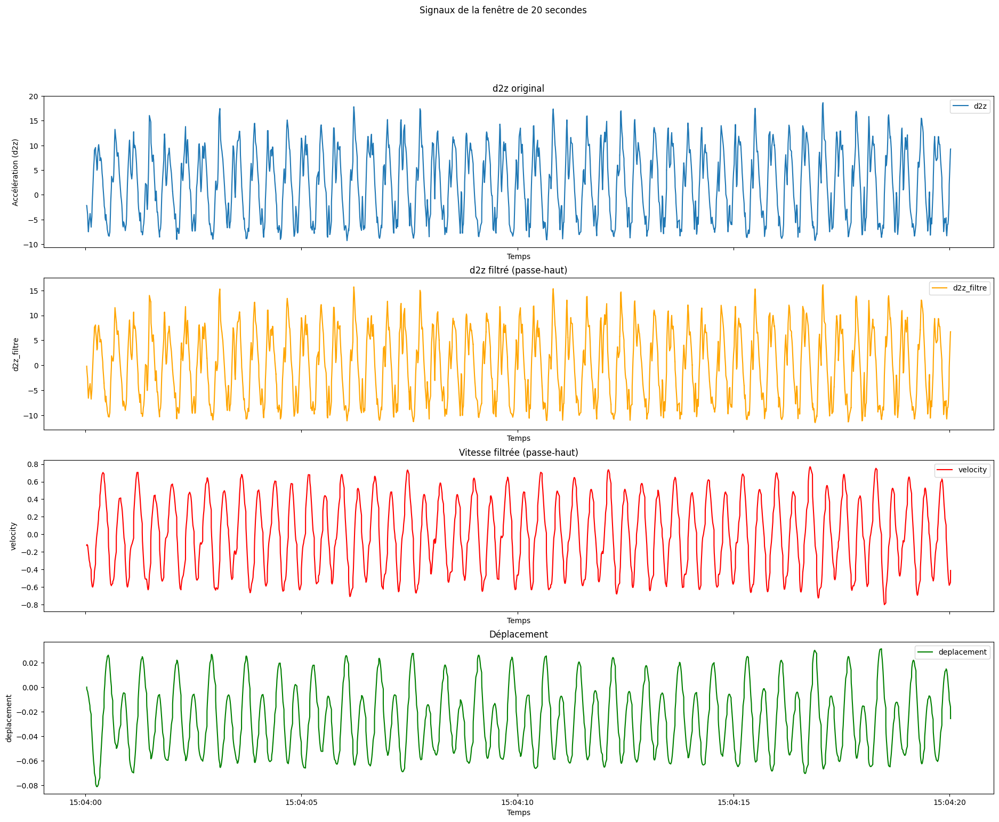

In [525]:
# Tracé des signaux d2z, d2z_filtre, velocity, deplacement de la fenêtre de 20 secondes uniquement
window_data4 = Trot_gauche_new[(Trot_gauche_new.index >= start_20s_window4) & (Trot_gauche_new.index <= end_20s_window4)]


fig, axs = plt.subplots(4, 1, figsize=(23, 17), sharex=True)
axs[0].plot(window_data4.index, window_data4['d2z'], label='d2z')
axs[0].set_ylabel('Accélération (d2z)')
axs[0].legend()
axs[0].title.set_text('d2z original')
axs[0].set_xlabel('Temps')

axs[1].plot(window_data4.index, window_data4['d2z_filtre'], label='d2z_filtre', color='orange')
axs[1].set_ylabel('d2z_filtre')
axs[1].legend()
axs[1].title.set_text('d2z filtré (passe-haut)')
axs[1].set_xlabel('Temps')

axs[2].plot(window_data4.index, window_data4['velocity'], label='velocity', color='red')
axs[2].set_ylabel('velocity')
axs[2].legend()
axs[2].title.set_text('Vitesse filtrée (passe-haut)')
axs[2].set_xlabel('Temps')

axs[3].plot(window_data4.index, window_data4['deplacement'], label='deplacement', color='green')
axs[3].set_ylabel('deplacement')
axs[3].legend()
axs[3].title.set_text('Déplacement')
axs[3].set_xlabel('Temps')

plt.xlabel('Temps')
plt.suptitle('Signaux de la fenêtre de 20 secondes')
plt.show()

### Calcul des foulées
Trouver les pics dans le signal de déplacement, donc les foulées du cheval.

/var/folders/dy/p7g7n6253j76sj1k7y99nbv80000gn/T/ipykernel_17124/1520386640.py:7: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/dy/p7g7n6253j76sj1k7y99nbv80000gn/T/ipykernel_17124/1520386640.py:8: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



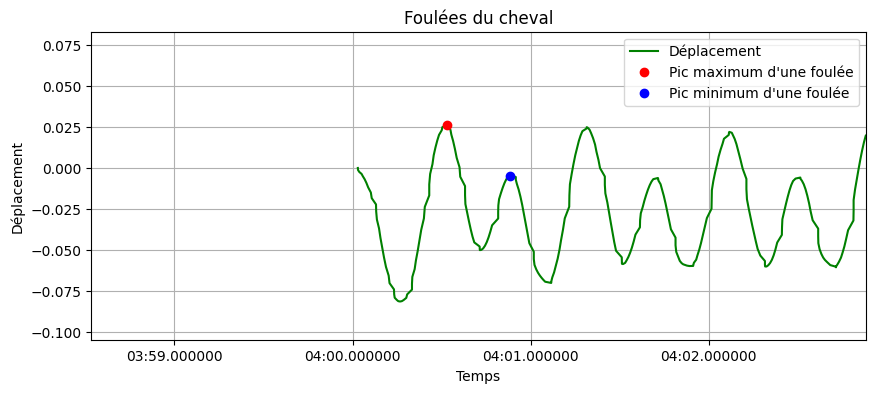

In [526]:
displacement4 = Trot_gauche_new['deplacement']
time_index_displacement4 = Trot_gauche_new.index
peak1, peak2 = trouver_foulees(displacement4)
if peak1 is not None and peak2 is not None:
    afficher_foulees(displacement4, peak1, peak2, time_index_displacement4)
else:
    print("Unable to find a stride within the signal based on the given prominence.")

### <span style="color:#C23028">Calcul des ISG</span>


In [527]:
peaks, troughs, min_length = identifier_foulees(displacement4)

#### **Liste des ISG et des harmoniques pour chaque foulée**

In [528]:
ISGs4, A1, A2 = calculate_ISG(min_length, troughs, displacement4)

for i in range(len(ISGs4)):
    print_values(A1[i], A2[i], ISGs4[i])

A1: 0.969723 | A2: 1.478746 | ISG: 69.928130
A1: 0.761792 | A2: 1.431815 | ISG: 77.937868
A1: 0.703605 | A2: 1.403140 | ISG: 79.907148
A1: 0.627063 | A2: 1.339420 | ISG: 82.022778
A1: 0.619129 | A2: 1.369755 | ISG: 83.035501
A1: 0.662991 | A2: 1.406840 | ISG: 81.827152
A1: 0.639881 | A2: 1.480145 | ISG: 84.253673
A1: 0.588927 | A2: 1.462729 | ISG: 86.050777
A1: 0.620294 | A2: 1.345051 | ISG: 82.462295
A1: 0.541775 | A2: 1.272708 | ISG: 84.659020
A1: 0.423092 | A2: 1.468203 | ISG: 92.332538
A1: 0.419196 | A2: 1.432132 | ISG: 92.108366
A1: 0.622866 | A2: 1.195944 | ISG: 78.662803
A1: 0.716530 | A2: 1.320739 | ISG: 77.260029
A1: 0.649610 | A2: 1.369086 | ISG: 81.623656
A1: 0.620752 | A2: 1.330057 | ISG: 82.114015
A1: 0.676317 | A2: 1.319051 | ISG: 79.183337
A1: 0.768937 | A2: 1.397966 | ISG: 76.772830
A1: 0.818638 | A2: 1.293051 | ISG: 71.386635
A1: 0.664933 | A2: 1.083250 | ISG: 72.632731
A1: 0.612849 | A2: 1.098313 | ISG: 76.257085
A1: 0.791952 | A2: 1.268891 | ISG: 71.966409
A1: 0.8410

#### **Création d'un dataframe**

In [529]:
values_list4 = []
for i in range(len(ISGs4)):
    append_values_to_list(A1[i], A2[i], ISGs4[i], values_list4)
df_ISG4 = pd.DataFrame(values_list4)
df_ISG4.head()

,A1,A2,ISG
0,0.969723,1.478746,69.928130
1,0.761792,1.431815,77.937868
2,0.703605,1.403140,79.907148
3,0.627063,1.339420,82.022778
4,0.619129,1.369755,83.035501


### <span style="color:#C23028">Valeur de l'ISG</span>

In [530]:
df_ISG4.describe()

,A1,A2,ISG
count,627.000000,627.000000,627.000000
mean,0.754886,1.378062,76.645766
std,0.170517,0.115255,7.922234
min,0.098916,1.004378,15.254954
25%,0.658854,1.295075,71.485050
50%,0.752396,1.375621,76.920612
75%,0.855920,1.454746,81.968247
max,2.367276,1.808398,99.415949


ISG de <span style="color:#C23028">**76.645766**</span> pour ce jeu de données

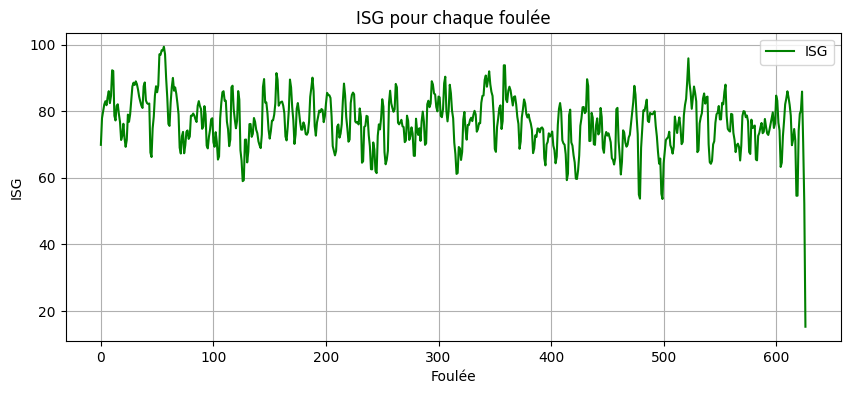

In [531]:
plt.figure(figsize=(10, 4))
plt.plot(np.arange(len(ISGs4)), ISGs4, label='ISG', color='green')
plt.title('ISG pour chaque foulée')
plt.xlabel('Foulée')
plt.ylabel('ISG')
plt.legend()
plt.grid(True)
plt.show()

#### **Boxplot des ISG pour visualiser les valeurs aberantes**


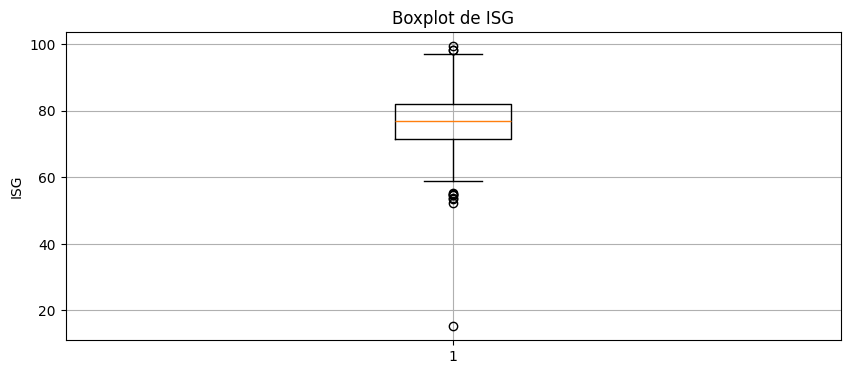

In [532]:
plt.figure(figsize=(10, 4))
plt.boxplot(ISGs4)
plt.title('Boxplot de ISG')
plt.ylabel('ISG')
plt.grid(True)
plt.show()

#### **Tri des valeurs aberantes**
Les points qui apparaissent en dehors des moustaches représentent des **valeurs aberrantes**.

In [533]:
min_value4 = 59
max_value4 = 97
ISGs_filtered4 = ISG_min_max(ISGs4, min_value4, max_value4)

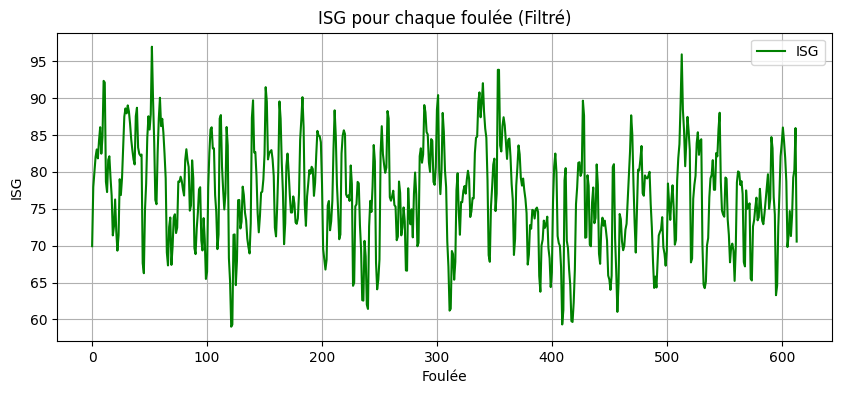

In [534]:
plt.figure(figsize=(10, 4))
plt.plot(np.arange(len(ISGs_filtered4)), ISGs_filtered4, label='ISG', color='green')
plt.title('ISG pour chaque foulée (Filtré)')
plt.xlabel('Foulée')
plt.ylabel('ISG')
plt.legend()
plt.grid(True)

Text(0.5, 1.0, 'Boxplot de ISG (Filtré)')

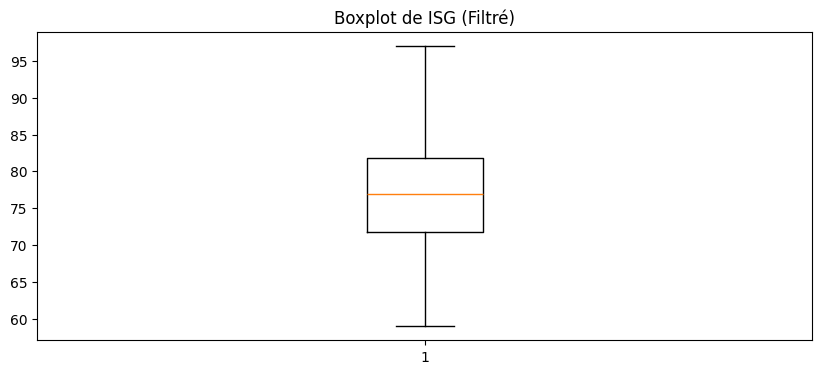

In [535]:
plt.figure(figsize=(10, 4))
plt.boxplot(ISGs_filtered4)
plt.title('Boxplot de ISG (Filtré)')

In [536]:
df_ISG_filtered4 = df_ISG4[(df_ISG4['ISG'] >= min_value4) & (df_ISG4['ISG'] <= max_value4)]
df_ISG_filtered4.describe()

,A1,A2,ISG
count,614.000000,614.000000,614.000000
mean,0.752171,1.380029,76.827661
std,0.143060,0.112337,6.954869
min,0.265989,1.083250,59.009701
25%,0.661502,1.296780,71.812908
50%,0.751210,1.376449,76.961379
75%,0.853783,1.456450,81.873768
max,1.136816,1.808398,96.959027


Apres un filtre des données, l'ISG moyen est de <span style="color:#C23028">**76.827661**</span>

## <span style="color:#C23028">**Récapitulatif**</span>   

In [537]:
df_ISG1.describe()

,A1,A2,ISG
count,118.000000,118.000000,118.000000
mean,0.890455,1.513142,73.940655
std,0.273549,0.131681,11.248176
min,0.094891,1.248455,47.473351
25%,0.710223,1.418374,65.574254
50%,0.916671,1.496832,74.105009
75%,1.092196,1.586573,81.793273
max,1.396826,1.960993,99.539785


In [538]:
df_ISG_filtered2.describe()

,A1,A2,ISG
count,166.000000,166.000000,166.000000
mean,0.584031,1.201768,80.375471
std,0.179989,0.086753,9.394320
min,0.213818,0.933122,55.955094
25%,0.448469,1.153114,74.271849
50%,0.574456,1.205038,81.934572
75%,0.705057,1.258645,88.168159
max,1.035396,1.438792,97.006087


In [539]:
df_ISG_filtered3.describe()

,A1,A2,ISG
count,608.000000,608.000000,608.000000
mean,0.435221,1.383436,90.395185
std,0.128034,0.106547,4.860927
min,0.056615,1.032076,76.421200
25%,0.344562,1.321251,86.929394
50%,0.439514,1.379948,90.848870
75%,0.529467,1.452552,94.122882
max,0.774316,1.840437,99.815591


In [540]:
df_ISG4.describe()

,A1,A2,ISG
count,627.000000,627.000000,627.000000
mean,0.754886,1.378062,76.645766
std,0.170517,0.115255,7.922234
min,0.098916,1.004378,15.254954
25%,0.658854,1.295075,71.485050
50%,0.752396,1.375621,76.920612
75%,0.855920,1.454746,81.968247
max,2.367276,1.808398,99.415949
